# Clustering, Outliers, and Spatial Analysis
This notebook analyzes trends in high-magnitude flow (HMF) metrics using PCA, k-means cluster analysis

In [1]:
# Import packages
import pandas as pd 
import numpy as np
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
#import contextily as cx
import requests
import calendar
from importlib import reload
import mapclassify as mc
from dataretrieval import nwis

from datetime import datetime, timedelta
from shapely.geometry import Point
from io import StringIO
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Patch

# Custom modules are imported in multiple locations to faciliate easy reloading when edits are made to their respective files
import Src.classes as cl
import Src.func_ko as fn
reload(cl)
reload(fn)

C:\Users\kondr\anaconda3\lib\site-packages\geopandas\_compat.py:115: UserWarning: The Shapely GEOS version (3.7.0-CAPI-1.11.0 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


<module 'Src.func_ko' from 'C:\\Users\\kondr\\Documents\\GitHub\\HighMagFlows_EPA_Project\\Src\\func_ko.py'>

## Import files

### Import valid streamgage HMF metrics

In [2]:
# Dataset upload
data_paths = {
    '30_90': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_90.xlsx',
    '50_90': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_90.xlsx',
    '30_95': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_95.xlsx',
    '50_95': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_95.xlsx'    
}

#dfs_metrics = {key: pd.read_excel(path, sheet_name='site_metrics') for key, path in data_paths.items()}
dfs_valid = {key: pd.read_excel(path) for key, path in data_paths.items()}

In [3]:
# Number of valid gages
date_ranges = ['30', '50']
percentiles = ['90', '95']
for date_range in date_ranges:
    for percentile in percentiles: 
        df_length = dfs_valid[f'{date_range}_{percentile}']
        print(f'{date_range}-Year gages (valid = True): {len(df_length)}')

30-Year gages (valid = True): 4242
30-Year gages (valid = True): 4242
50-Year gages (valid = True): 3314
50-Year gages (valid = True): 3314


### Import annual timeseries dfs

In [4]:
data_paths = {
    '30_90': 'Prelim_Data/annual_metrics_subdf_30_90.parquet',
    '50_90': 'Prelim_Data/annual_metrics_subdf_50_90.parquet',
    '30_95': 'Prelim_Data/annual_metrics_subdf_30_95.parquet',
    #'50_95': 'Prelim_Data/annual_metrics_subdf_50_95.parquet'    
}

dfs_annual = {key: pd.read_parquet(path, engine='pyarrow') for key, path in data_paths.items()}

### Import shapefiles

In [5]:
# US states, aquifers, and HUC2s to plot
lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
aq_shape = gpd.read_file('ShapeFiles/Aquifers/_Master_Aquifer/master_aquifer.shp')
aq_usgs = gpd.read_file('ShapeFiles/Aquifers_USGS/us_aquifers.shp')
stream_network = gpd.read_file('ShapeFiles/Streams_US/us_streams.shp')
#stream_network_detailed = gpd.read_file('ShapeFiles/Streams_US/us_streams_detailed.shp')
aq_usgs_selected_10 = gpd.read_file('ShapeFiles/Aquifers_USGS_10/Aquifers_USGS_10.shp')
aq_usgs_selected_25 = gpd.read_file('ShapeFiles/Aquifers_USGS_25/Aquifers_USGS_25.shp')
huc2 = gpd.read_file('ShapeFiles/_Master_HUC2/master_huc2.shx')

## Visualize data

### Stream gages

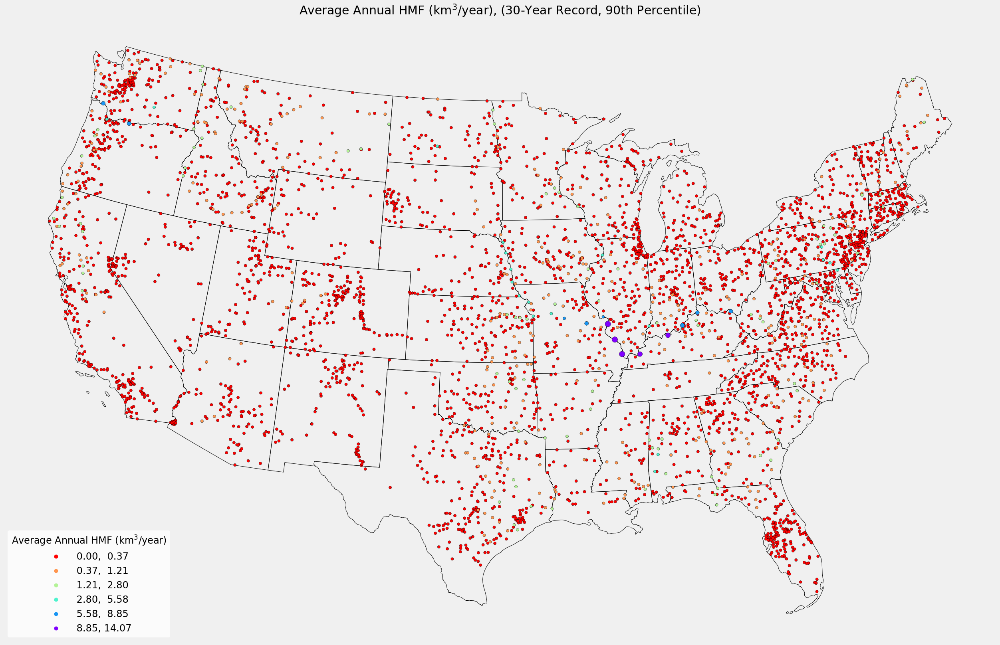

Min: 3.07289888607744e-06
Max: 14.06936630259124


In [362]:
date_range = '30'
percentile = '90'
metric = 'annual_hmf'#'inter_annual%' #'timing' #'intra_annual' #'event_hmf' #'event_duration' #'annual_duration' #'annual_hmf' #'inter_annual%'
save_location = f'Saved_Visuals/HMF_metrics/Kirsten/{metric}_{date_range}_{percentile}.png'

def plot_hmf_metric(df, metric, save_location):    
    fig, ax = plt.subplots(figsize=(35, 35))

    plt.title(f'{fn.FLOW_METRIC_UNITS[metric]}, ({date_range}-Year Record, {percentile}th Percentile)', fontsize=30)
    legend_frmt = {
        "title": f"{fn.FLOW_METRIC_UNITS[metric]}",
        #"reverse": False,
        #"loc": "lower right",
        "facecolor": "white",
        #"alignment": 'center',
        "edgecolor": 'none',
        "framealpha": 0.80,
        'fontsize': 24,
        'title_fontsize': 24
    }

    # State basemap
    lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
    #lower48 = lower48.to_crs(epsg=4269)
    lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 


    geo_df = fn.convert_geometry(df)
    geo_df.crs = "epsg:4269"
    geo_df = geo_df.to_crs('ESRI:102003')
    geo_df = geo_df.merge(df, how='left', left_index=True, right_index=True)

    classifier = mc.NaturalBreaks(geo_df[metric], k=6)
    geo_df = geo_df.sort_values(metric, ascending=True)

    def get_marker_size(value):
        # Define your logic to determine marker size based on the value
        if value < df[metric].max()*0.5:
            return 50
        elif value < df[metric].max()*0.6:
            return 100
        elif value < df[metric].max()*0.7:
            return 125
        elif value < df[metric].max()*0.85:
            return 150
        elif value < df[metric].max()*0.9:
            return 175
        else:
            return 200

    # All gauges
    cmap='rainbow_r' #'rainbow_r'
    geo_df.plot(ax=ax, column=metric, scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                cmap=cmap, legend=True, legend_kwds=legend_frmt, 
                alpha=1.0, marker='o', 
                markersize=[get_marker_size(value) for value in geo_df[metric]],
                edgecolor='black', linewidth=0.5)

    plt.axis("off")

    plt.tight_layout()
    plt.savefig(save_location, bbox_inches='tight')

    plt.show()

#for date_range in date_ranges:
#    for percentile in percentiles:
        
df_wrong_index = dfs_valid[f'{date_range}_{percentile}']
df = df_wrong_index.reset_index()
plot_hmf_metric(df, metric, save_location)

print('Min:', df[metric].min())
print('Max:', df[metric].max())

### HMF metrics

In [12]:
date_range = '30'
percentile = '90'
df = dfs_valid[f'{date_range}_{percentile}']
df.head()
# print(df.shape)
# print(df.columns)

var_to_keep_all = ['annual_hmf', 'six_mo_hmf', 'three_mo_hmf', #'site_no',
       'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%',
       'intra_annual', 'timing', 'jan_hmf', 'feb_hmf', 'mar_hmf', 'apr_hmf',
       'may_hmf', 'jun_hmf', 'jul_hmf', 'aug_hmf', 'sep_hmf', 'oct_hmf',
       'nov_hmf', 'dec_hmf']
var_to_keep = ['annual_hmf', 'six_mo_hmf', 'three_mo_hmf',
       'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%',
       'intra_annual', 'timing']
df = df[var_to_keep_all]
df

,annual_hmf,six_mo_hmf,three_mo_hmf,annual_duration,event_duration,event_hmf,inter_annual%,intra_annual,timing,jan_hmf,...,mar_hmf,apr_hmf,may_hmf,jun_hmf,jul_hmf,aug_hmf,sep_hmf,oct_hmf,nov_hmf,dec_hmf
0,0.109441,0.095362,0.047981,36.533333,3.372086,0.009768,100.000,10.066667,151.200000,0.015056,...,0.030154,0.019327,0.004372,0.005904,0.037374,0.003897,0.009416,0.006395,0.014464,0.036851
1,0.155185,0.118945,0.063317,36.466667,4.035124,0.016368,100.000,8.333333,160.500000,0.028844,...,0.034773,0.036458,0.010722,0.006459,0.079566,0.010601,0.017965,0.009603,0.011871,0.038390
2,0.114796,0.092049,0.050878,36.100000,5.286581,0.015215,100.000,6.766667,157.800000,0.020031,...,0.025746,0.025765,0.005811,0.006737,0.041690,0.013623,0.022142,0.023512,0.008471,0.053784
3,0.027931,0.016594,0.008420,37.689655,3.102121,0.002232,96.667,11.620690,173.689655,0.003842,...,0.004708,0.004459,0.002035,0.002616,0.003644,0.002414,0.009583,0.004359,0.002026,0.004079
4,0.117638,0.091072,0.047558,36.466667,6.960099,0.021238,100.000,5.100000,170.500000,0.030241,...,0.035303,0.027045,0.009282,0.017244,0.035734,0.013909,0.026888,0.035255,0.019206,0.061624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4237,0.330262,0.013300,0.000000,49.454545,35.128788,0.226384,73.333,1.409091,265.045455,0.000000,...,0.076040,0.216571,0.081377,0.220294,0.093089,0.019349,0.000000,0.000000,0.000000,0.000000
4238,0.332683,0.013753,0.000000,49.772727,39.939394,0.279784,73.333,1.454545,265.545455,0.000000,...,0.044503,0.213562,0.076009,0.221871,0.098812,0.018366,0.000000,0.000000,0.000000,0.000000
4239,0.021793,0.000367,0.000000,37.758621,22.106322,0.013347,96.667,2.068966,238.793103,0.000000,...,0.000098,0.000811,0.011297,0.012702,0.002144,0.000000,0.000000,0.000000,0.000000,0.000000
4240,0.075912,0.015882,0.001740,42.153846,19.112821,0.038628,86.667,2.423077,235.076923,0.000000,...,0.019254,0.013665,0.031672,0.040051,0.019676,0.000471,0.005832,0.000440,0.000000,0.000000


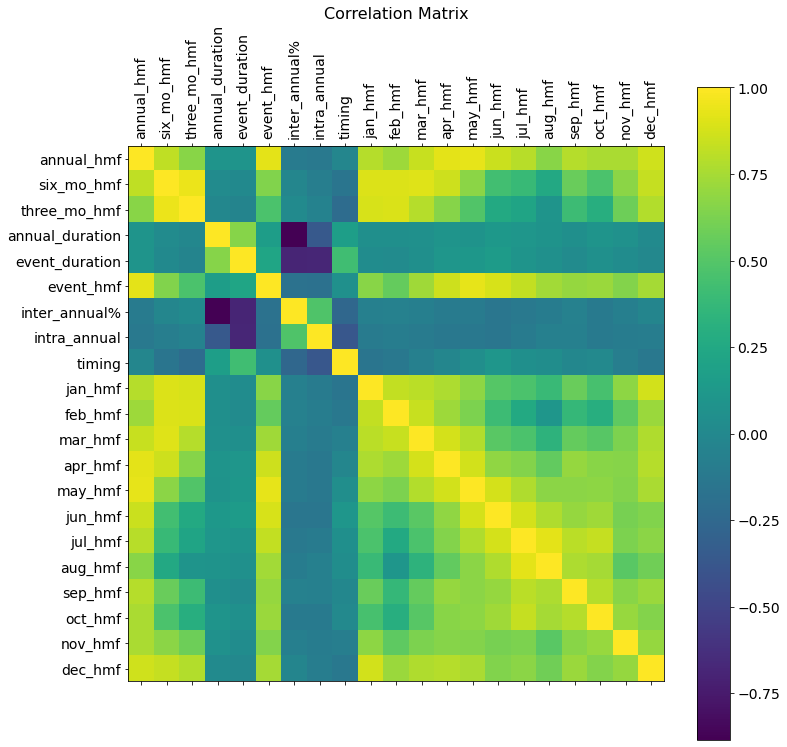

In [14]:
fig, ax = plt.subplots(figsize=(12, 12))
cax = ax.matshow(df.corr())

# Set ticks and labels
ax.set_xticks(range(df.select_dtypes(['number']).shape[1]))
ax.set_xticklabels(df.select_dtypes(['number']).columns, fontsize=14, rotation=90)
ax.set_yticks(range(df.select_dtypes(['number']).shape[1]))
ax.set_yticklabels(df.select_dtypes(['number']).columns, fontsize=14)

# Add colorbar
cb = fig.colorbar(cax)
cb.ax.tick_params(labelsize=14)

ax.set_title('Correlation Matrix', fontsize=16)

plt.show()

# Known relationships:
# Direct relationship: Annual HMF and event HMF, and six and three month HMF
# Direct relationship: Annual duration and event duration
# Inverse annual duration and inter-annual: Higher annual duration = lower inter-annual freq (years with more HMF days are less frequent)
# Inverse event duration and inter-annual: High event duration = lower inter-annual freq (longer HMF event happen less often)
# Inverse event duration and intra-annual: Longer event duration = lower event freq (longer events happen less each year)
# Direct timing and monthly HMF: higher event HMF in certain months

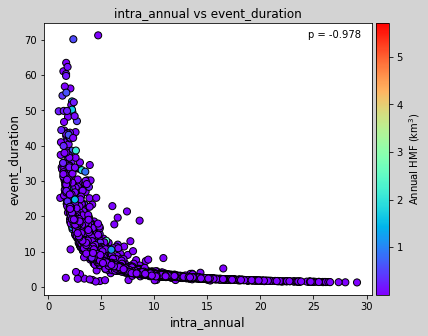

In [15]:
var1 = 'intra_annual'
var2 = 'event_duration'
fig, ax = plt.subplots(figsize=(7, 5), facecolor='lightgrey')
plt.title(f"{var1} vs {var2}", fontsize=12)

#classifier = mc.Quantiles(df_9['annual_hmf'])
#cmap = plt.get_cmap('winter')
#colors = [cmap(classifier(i)) for i in df_9['annual_hmf']]

#plot = plt.scatter(df[var1], df[var2], c=df['annual_hmf'])
plot = plt.scatter(df[var1], df[var2], c=df['event_hmf'], cmap='rainbow', edgecolor='black', s=50, alpha=1.0)
pearson_corr = df[var1].corr(df[var2], method='spearman')
fig.text(0.65, 0.84, f"p = {pearson_corr:.3f}", fontsize=10)

cb = plt.colorbar(plot, label='Annual HMF ($\mathregular{km^3}$)', pad=0.01)

plt.ylabel(f'{var2}', fontsize=12)
plt.xlabel(f'{var1}', fontsize=12)

plt.show()

### Annual timeseries

In [53]:
date_range = '30'
percentile = '90'
df = dfs_annual[f'{date_range}_{percentile}'].rename(columns={'total_events': 'intra_annual'})

metric = 'annual_hmf' #'timing' #'intra_annual' #'event_hmf' #'event_duration' #'annual_duration' #'annual_hmf' #'inter_annual%'
metric_df = df[['site_no', 'water_year', metric]]
pivot_df = metric_df.pivot(index='site_no', columns='water_year', values=metric).reset_index()
pivot_df.head()

water_year,site_no,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,01010000,0.748652,0.441949,0.430720,0.765338,0.251239,0.660845,0.706228,0.535800,0.186796,...,1.004075,0.324685,0.440261,0.568486,0.400088,0.225648,0.730817,0.920353,0.893979,0.601931
1,01010070,0.089350,0.077409,0.055046,0.109819,0.032152,0.097750,0.106775,0.076489,0.034719,...,0.121326,0.063932,0.064016,0.091186,0.058018,0.063367,0.137806,0.113423,0.108348,0.066785
2,01010500,1.490209,0.869758,0.860705,1.477976,0.524301,1.457425,1.489475,0.996246,0.433044,...,1.864046,0.688222,0.851408,1.251913,0.773852,0.624366,1.775969,1.690094,1.781596,1.159187
3,01011000,0.617682,0.242206,0.249509,0.535658,0.106394,0.427794,0.537750,0.401270,0.150004,...,0.601466,0.211218,0.235003,0.416512,0.248658,0.178030,0.559138,0.577957,0.522483,0.379469
4,01013500,0.365078,0.131626,0.126830,0.250064,0.111735,0.260340,0.352233,0.253025,0.089985,...,0.274677,0.068504,0.107429,0.238884,0.090450,0.112958,0.410095,0.428346,0.394535,0.170331


In [54]:
df

,site_no,water_year,annual_hmf,annual_duration,event_hmf,event_duration,intra_annual,timing
0,02342500,1990,0.092031,29.0,0.010226,3.222222,9.0,181.0
1,02342500,1991,0.067863,37.0,0.009695,5.285714,7.0,137.0
2,02342500,1992,0.125069,56.0,0.007817,3.500000,16.0,58.0
3,02342500,1993,0.164619,42.0,0.016462,4.200000,10.0,280.0
4,02342500,1994,0.048014,23.0,0.006002,2.875000,8.0,139.0
...,...,...,...,...,...,...,...,...
25,13018300,2015,0.000051,14.0,0.000013,3.500000,4.0,250.0
26,13018300,2016,0.007294,77.0,0.007294,77.000000,1.0,254.0
27,13018300,2017,0.003553,56.0,0.003553,56.000000,1.0,240.0
28,13018300,2018,0.001694,46.0,0.000847,23.000000,2.0,256.0


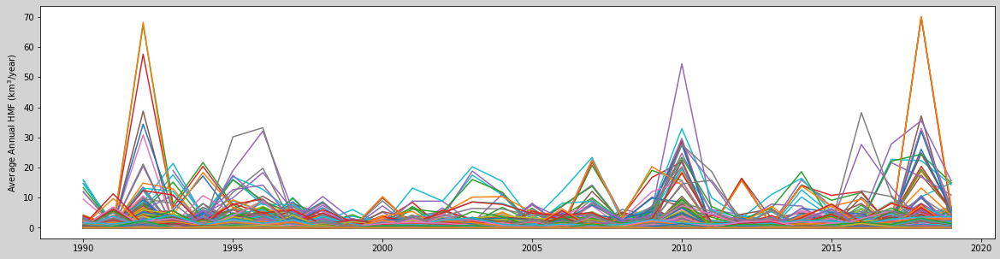

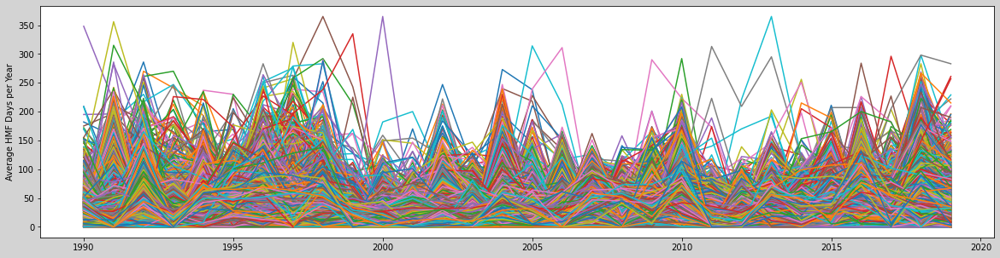

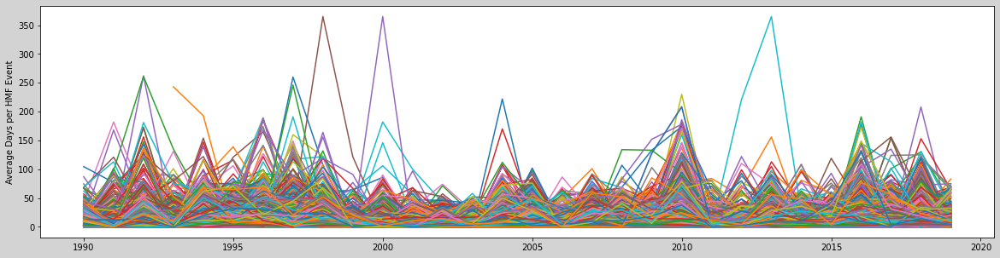

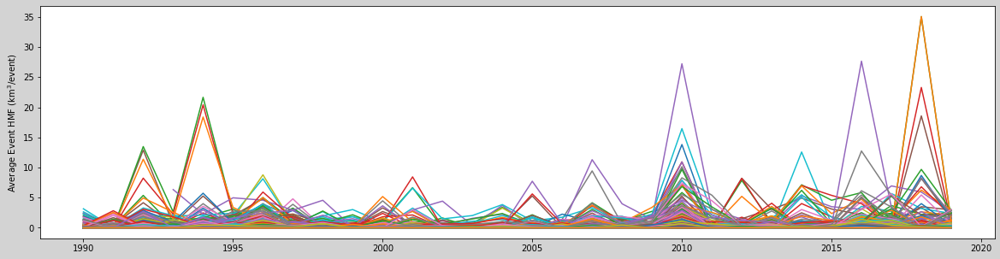

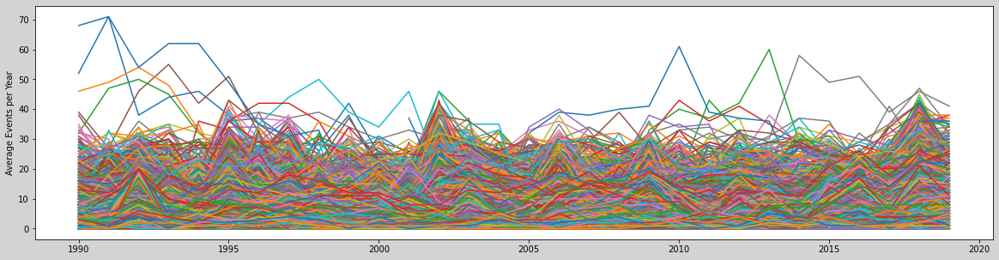

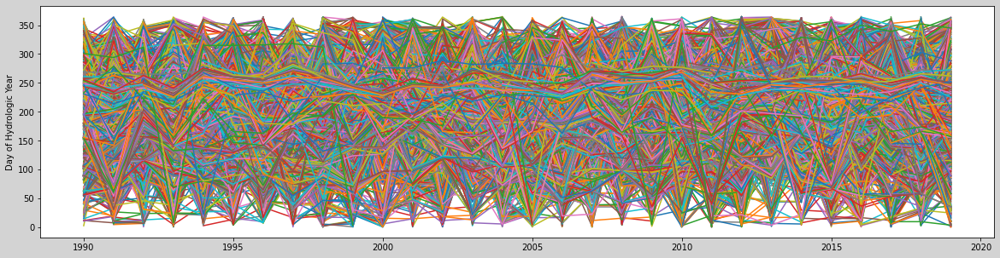

In [26]:
metric_list = ['annual_hmf', 'annual_duration', 'event_duration', 'event_hmf', 'intra_annual', 'timing']
for metric in metric_list:
    fig, ax = plt.subplots(figsize=(20, 5), facecolor='lightgrey')
    for site in df['site_no'].unique():
        site_data = df[df['site_no'] == site]
        plt.plot(site_data['water_year'], site_data[metric], label=site)
        plt.ylabel(f'{fn.FLOW_METRIC_UNITS[metric]}')

### Distribution of metrics with and without outliers

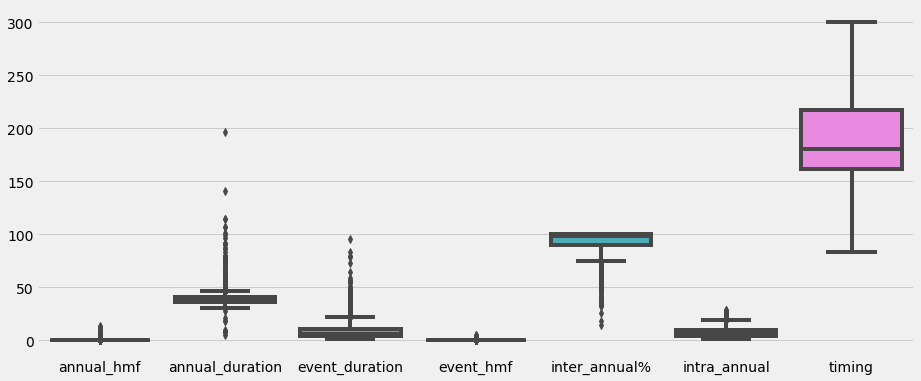

3314


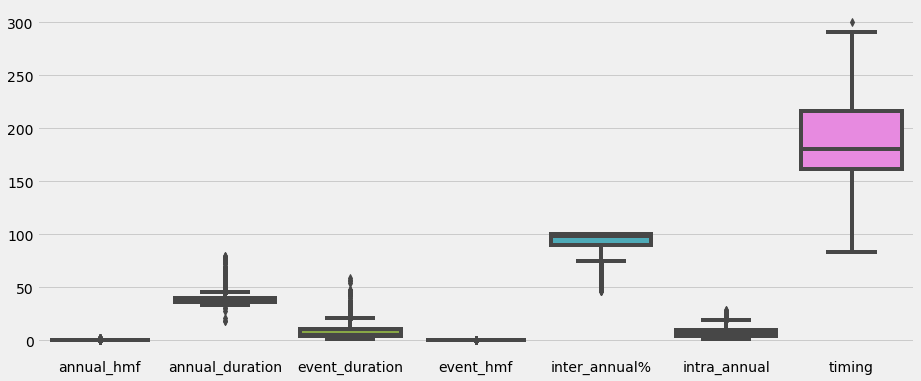

3208


In [365]:
# WITH outliers
metric_list = ['annual_hmf', 'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%', 'intra_annual', 'timing']
date_range = '50'
percentile = '90'
df = dfs_valid[f'{date_range}_{percentile}']
nbins = 50

def metric_histogram(df, metric, nbins):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 4))
    #if metric == 'annual_hmf':
    #    ax.hist(np.log(df[metric]), bins=nbins, edgecolor='black')
    ax.hist(df[metric], bins=nbins, edgecolor='black')
    ax.set_title(f'{fn.FLOW_METRIC_UNITS[metric]}', fontsize=14)
    #ax.set_ylim(0, 200)
    ax.set_ylabel('Count')
    plt.show()
    return

# Histograms
for metric in metric_list:
    metric_histogram(df, metric, nbins)

# Box plots
df_metrics = df[metric_list]
plt.rcParams['figure.figsize'] = [14,6]
sns.boxplot(data = df_metrics, orient="v")
plt.show()
print(len(df_metrics))

# WITHOUT outliers
def remove_outliers(data):
    df = data.copy()
    for col in list(df.columns):

        Q1 = df[str(col)].quantile(0.05)
        Q3 = df[str(col)].quantile(0.95)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5*IQR
        upper_bound = Q3 + 1.5*IQR

        df = df[(df[str(col)] >= lower_bound) & (df[str(col)] <= upper_bound)]

    return df

df_metrics_no_outliers = remove_outliers(df_metrics) # 155 (106) outlier sites in 50-year data (30-year data)
plt.rcParams['figure.figsize'] = [14,6]
sns.boxplot(data = df_metrics_no_outliers, orient="v")
plt.show()
print(len(df_metrics_no_outliers))

### Plot locations of outlier gages for all and each metric

C:\Users\kondr\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


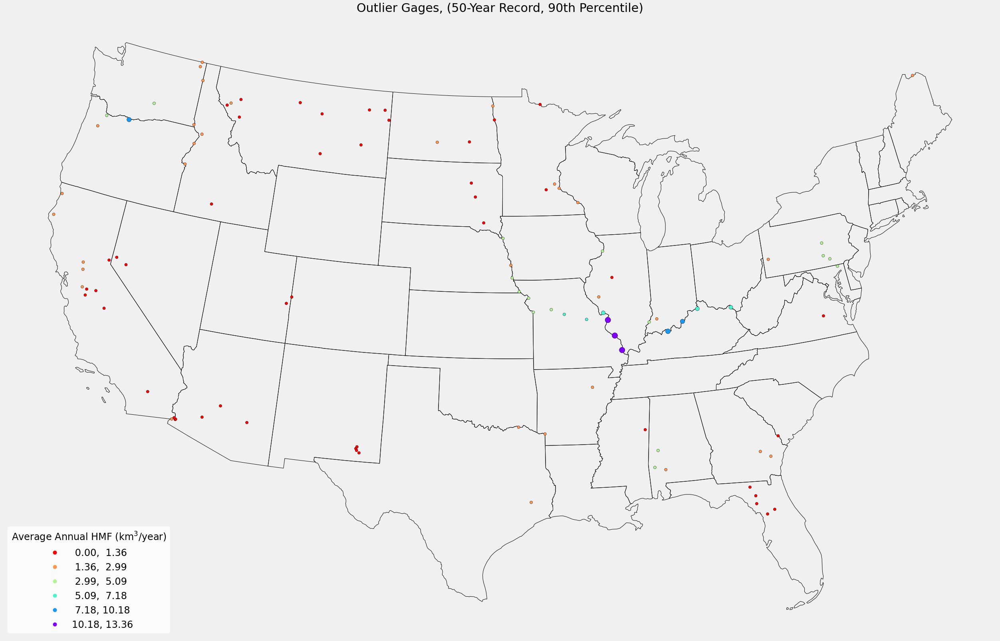

In [367]:
# Outlier gages
df_metrics['site_no'] = df['site_no']
df_metrics_no_outliers['site_no'] = df['site_no']
all_gages = df['site_no']
non_outliers = df_metrics_no_outliers['site_no']
outliers = list(set(all_gages) ^ set(non_outliers))
outlier_df = df[df['site_no'].isin(outliers)]
metric = 'annual_hmf'
save_location = f'Saved_Visuals/HMF_metrics/Outliers/all_gages_{date_range}_{percentile}.png'

def plot_outliers(df, metric, save_location):  
    fig, ax = plt.subplots(figsize=(35, 35))

    plt.title(f'Outlier Gages, ({date_range}-Year Record, {percentile}th Percentile)', fontsize=30)

    legend_frmt = {
        "title": f"{fn.FLOW_METRIC_UNITS[metric]}",
        #"reverse": False,
        #"loc": "lower right",
        "facecolor": "white",
        #"alignment": 'center',
        "edgecolor": 'none',
        "framealpha": 0.80,
        'fontsize': 24,
        'title_fontsize': 24
    }

    # State basemap
    lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
    #lower48 = lower48.to_crs(epsg=4269)
    lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 


    geo_df = fn.convert_geometry(df)
    geo_df.crs = "epsg:4269"
    geo_df = geo_df.to_crs('ESRI:102003')
    geo_df[metric] = df[metric]
    #geo_df = geo_df.merge(df, how='left', left_index=True, right_index=True)
    
    classifier = mc.NaturalBreaks(geo_df[metric], k=6)
    geo_df = geo_df.sort_values(metric, ascending=True)

    def get_marker_size(value):
        # Define your logic to determine marker size based on the value
        if value < df[metric].max()*0.5:
            return 50
        elif value < df[metric].max()*0.6:
            return 100
        elif value < df[metric].max()*0.7:
            return 125
        elif value < df[metric].max()*0.85:
            return 150
        elif value < df[metric].max()*0.9:
            return 175
        else:
            return 200

    # All gauges
    cmap='rainbow_r' #'rainbow_r'
    geo_df.plot(ax=ax, column=metric, scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                cmap=cmap, legend=True, legend_kwds=legend_frmt, 
                alpha=1.0, marker='o', 
                markersize=[get_marker_size(value) for value in geo_df[metric]],
                edgecolor='black', linewidth=0.5)

    plt.axis("off")

    plt.tight_layout()
    plt.savefig(save_location, bbox_inches='tight')

    plt.show()
    return

outlier_df = outlier_df.reset_index()
plot_outliers(outlier_df, metric, save_location)

annual_hmf
Lower bound: -1.3430488097565345
Upper bound: 2.2478343336352213
Number of outlier gages: 40
[2428400, 2467000, 2469761, 11447650, 11477000, 11530500, 12395500, 13334300, 3377500, 5587450, 7020500, 7022000, 3303280, 5420500, 6486000, 6610000, 6807000, 6813500, 3216600, 3277200, 3294500, 1576000, 1578310, 5378500, 6818000, 6893000, 6895500, 6909000, 6934500, 7010000, 6342500, 14105700, 14191000, 14211720, 1554000, 1570500, 3086000, 12396500, 12398600, 12472800]


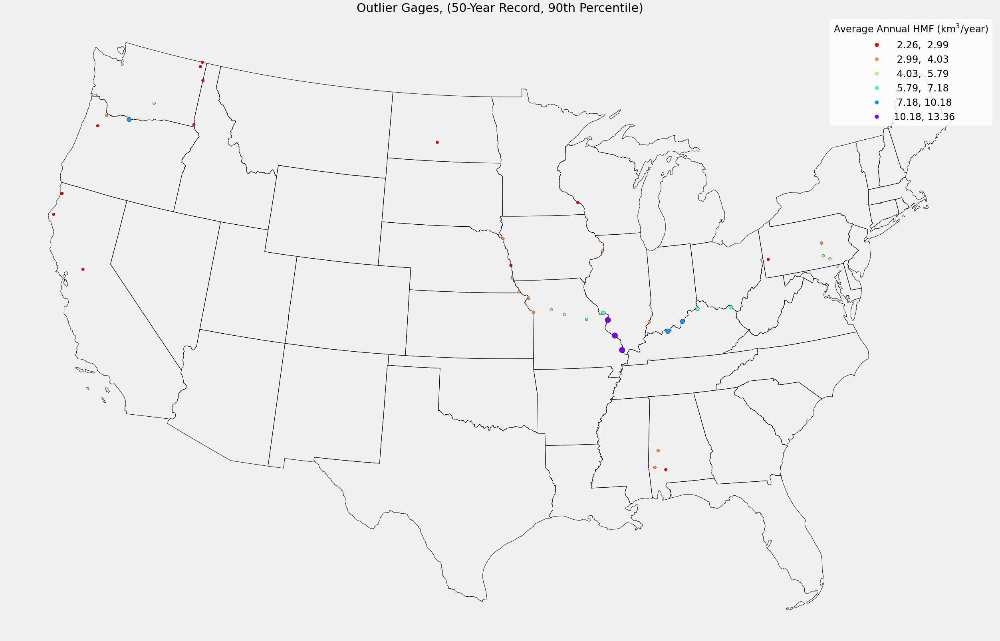

annual_duration
Lower bound: 10.076470588235289
Upper bound: 79.36588235294118
Number of outlier gages: 26
[9469500, 9513860, 9519800, 9520500, 9529300, 9521100, 10259300, 10337500, 11251000, 11274000, 11289650, 11290000, 11303500, 2239501, 2313100, 13095500, 10301500, 10349300, 8400000, 8401200, 8401900, 8405150, 6342500, 6470000, 6473000, 2037000]


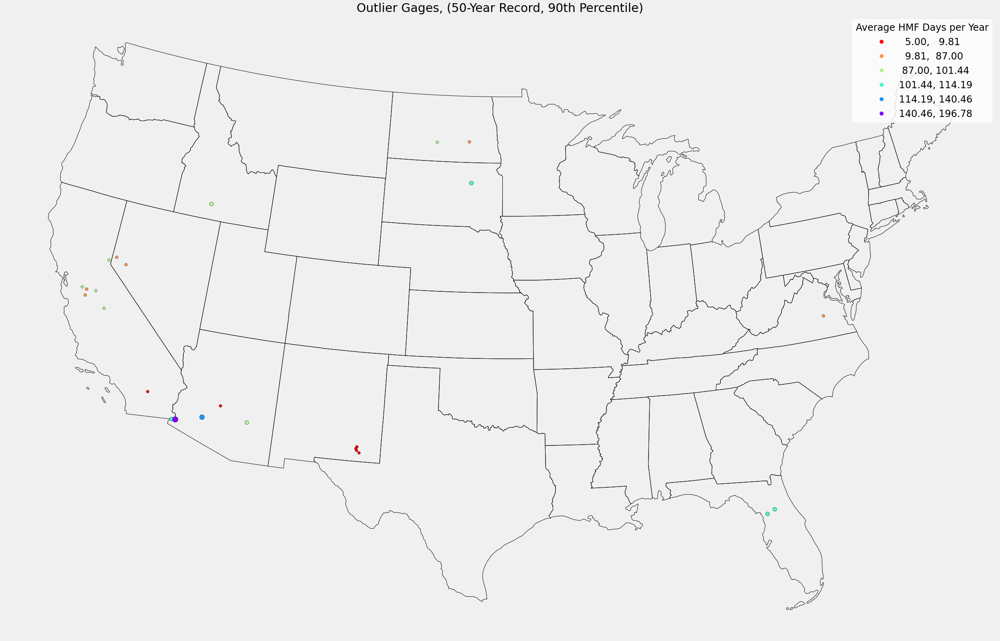

event_duration
Lower bound: -32.989231804937205
Upper bound: 61.344405749629
Number of outlier gages: 6
[9519800, 9520500, 9521100, 2239501, 2313100, 6473000]


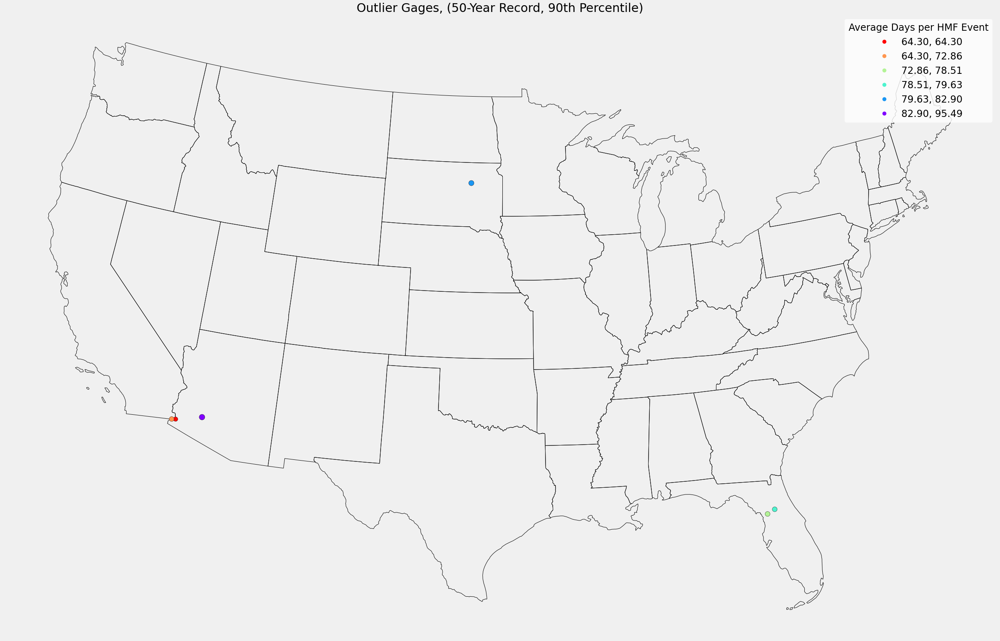

event_hmf
Lower bound: -0.34737343164053686
Upper bound: 0.5800902348951513
Number of outlier gages: 60
[2467000, 2469761, 9519800, 9429600, 9521100, 7074500, 7337000, 11303500, 11425500, 11447650, 2320500, 2323500, 2198500, 2226000, 12395500, 13269000, 13317000, 13290450, 13334300, 3377500, 5586100, 5587450, 7020500, 7022000, 3303280, 5420500, 6486000, 6610000, 6807000, 6813500, 3216600, 3277200, 3294500, 1014000, 1576000, 1578310, 5092000, 5331000, 5378500, 5344500, 6818000, 6893000, 6895500, 6909000, 6934500, 7010000, 6214500, 6309000, 6329500, 12354500, 12372000, 12389000, 6342500, 14105700, 14211720, 1570500, 9180500, 12396500, 12398600, 12472800]


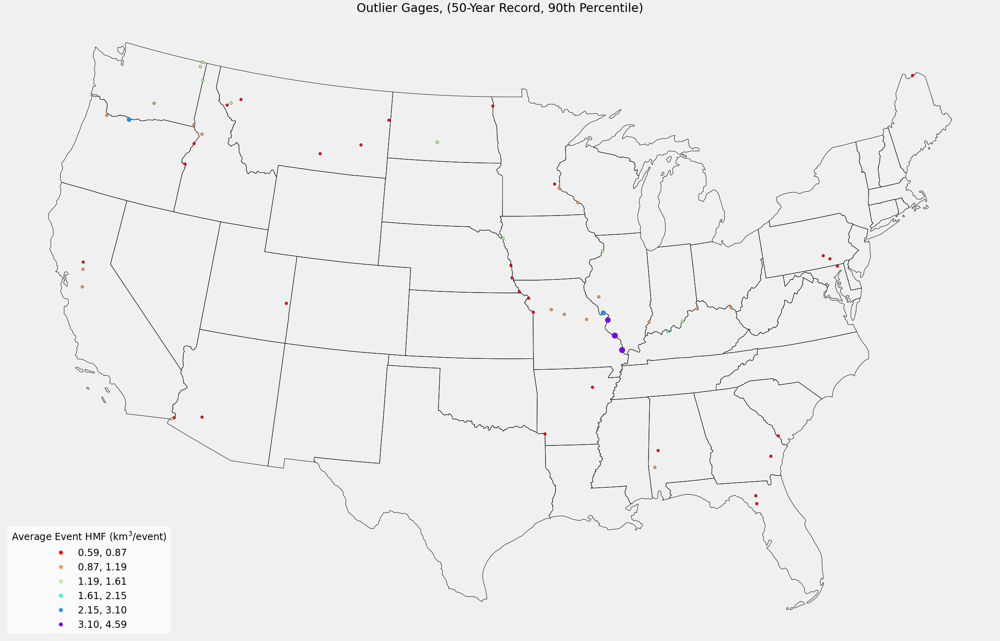

inter_annual%
Lower bound: 20.0
Upper bound: 148.0
Number of outlier gages: 2
[9529300, 2441390]


C:\Users\kondr\anaconda3\lib\site-packages\mapclassify\classifiers.py:1874: UserWarning: Not enough unique values in array to form 6 classes. Setting k to 2.
  UserWarning,


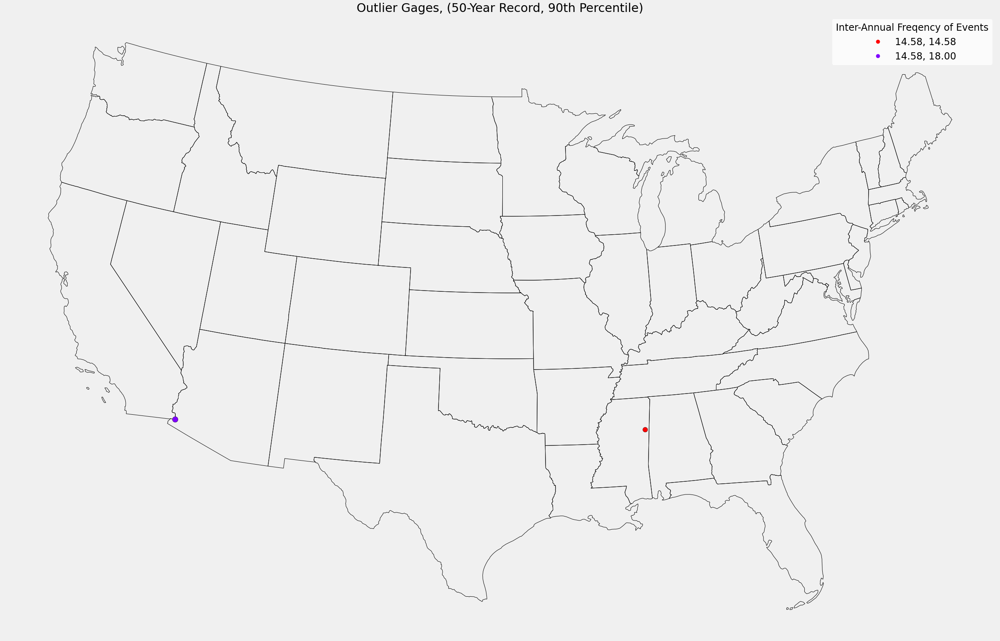

intra_annual
Lower bound: -16.700619759531726
Upper bound: 33.534004508780264
Number of outlier gages: 0
[]


C:\Users\kondr\anaconda3\lib\site-packages\mapclassify\classifiers.py:1874: UserWarning: Not enough unique values in array to form 6 classes. Setting k to 0.
  UserWarning,
C:\Users\kondr\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\kondr\anaconda3\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\kondr\anaconda3\lib\site-packages\geopandas\plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


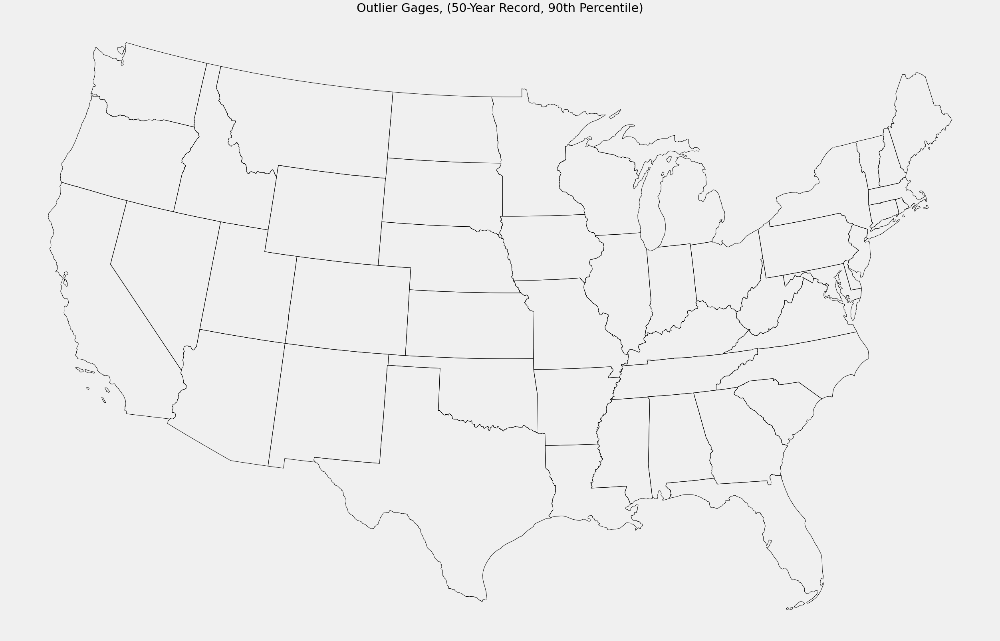

timing
Lower bound: -62.94250887311452
Upper bound: 442.8225488021296
Number of outlier gages: 0
[]


C:\Users\kondr\anaconda3\lib\site-packages\mapclassify\classifiers.py:1874: UserWarning: Not enough unique values in array to form 6 classes. Setting k to 0.
  UserWarning,
C:\Users\kondr\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\kondr\anaconda3\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\kondr\anaconda3\lib\site-packages\geopandas\plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


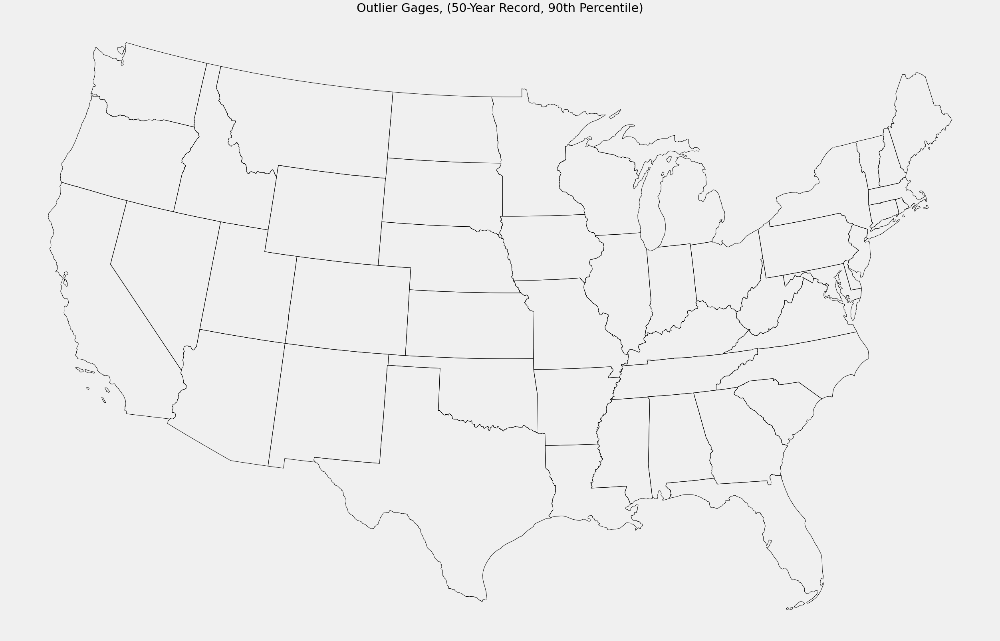

In [378]:
# Outliers for individual metrics
#metric = 'inter_annual%'
#save_location = f'Saved_Visuals/HMF_metrics/Outliers/{metric}_{date_range}_{percentile}.png'
    
def outlier_map_data(df_metrics, metric, save_location):
    Q1 = df_metrics[str(metric)].quantile(0.05)
    Q3 = df_metrics[str(metric)].quantile(0.95)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    outlier_gages = df_metrics[(df_metrics[metric] < lower_bound) | (df_metrics[metric] > upper_bound)]

    print(metric)
    print('Lower bound:', lower_bound)
    print('Upper bound:', upper_bound)
    print('Number of outlier gages:', len(outlier_gages))
    print(list(outlier_gages['site_no']))

    outlier_metric_df = df[df['site_no'].isin(list(outlier_gages['site_no']))]

    outlier_metric_df = outlier_metric_df.reset_index()

    save_location = f'Saved_Visuals/HMF_metrics/Outliers/{metric}_{date_range}_{percentile}.png'
    plot_outliers(outlier_metric_df, metric, save_location)
    return outlier_metric_df

for metric in metric_list:
    outlier_map_data(df_metrics, metric, save_location)

### Interactive map of outlier gages

In [387]:
# import plotly.express as px

# metric = 'event_duration'
# outlier_metric_df = outlier_map_data(df_metrics, metric, save_location)
# df_1 = outlier_metric_df.copy()


# df_1 = df_1.sort_values(by=metric, ascending=True)

# fig = px.scatter_mapbox(df_1, lat="dec_lat_va", lon="dec_long_va", hover_name='site_no', hover_data=["site_no", "station_nm","annual_hmf"], color=metric,
#                        zoom=3, height=700, width=1200, color_continuous_scale=px.colors.sequential.Bluered, opacity=0.75)

# fig.update_layout(mapbox_style="open-street-map")
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.update_geos(fitbounds="locations", visible=False)
# fig.show()

## Import and noramalize mean HMF metric data

## Controls

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [492]:
# (1) Average metric data
mean = True
metric_list = ['annual_hmf', 'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%', 'intra_annual', 'timing']
#selected_metrics = ['annual_hmf', 'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%', 'intra_annual', 'timing']
selected_metrics = ['event_duration', 'inter_annual%', 'intra_annual', 'timing']

date_range = '50'
percentile = '90'
df = dfs_valid[f'{date_range}_{percentile}']
metric_df = df[metric_list]

scaler = StandardScaler()
model = scaler.fit(metric_df)
scaled_df = model.transform(metric_df)
scaled_mean = pd.DataFrame(scaled_df, columns=['annual_hmf', 'annual_duration', 'event_duration', 'event_hmf', 'inter_annual%', 'intra_annual', 'timing'])

print(scaled_mean.head())

figname = 'scaled_mean'
df_cluster = scaled_mean
myseed = 112

   annual_hmf  annual_duration  event_duration  event_hmf  inter_annual%  \
0   -0.178494        -0.427143       -0.654665  -0.229536       0.657853   
1   -0.114574        -0.437072       -0.580552  -0.199682       0.657853   
2   -0.297268        -0.357432       -0.678339  -0.267453       0.481638   
3   -0.166434        -0.459414       -0.221682  -0.170789       0.657853   
4   -0.169266        -0.331707       -0.359115  -0.192967       0.466307   

   intra_annual    timing  
0      0.722928 -0.915887  
1      0.266832 -0.782848  
2      0.940148 -0.327923  
3     -0.506129 -0.549771  
4     -0.276214 -0.474657  


In [597]:
# (2) Singluar metric timeseries
mean = False
selected_metrics = 'annual_duration' #'timing' #'intra_annual' #'event_hmf' #'event_duration' #'annual_duration' #'annual_hmf' #'inter_annual%'

date_range = '50'
percentile = '90'
df_timeseries = dfs_annual[f'{date_range}_{percentile}'].rename(columns={'total_events': 'intra_annual'})
df = dfs_valid[f'{date_range}_{percentile}']

metric_df = df_timeseries[['site_no', 'water_year', selected_metrics]]
pivot_df = metric_df.pivot(index='site_no', columns='water_year', values=selected_metrics).reset_index()
columns = ['site_no', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', 
           '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', 
           '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', 
           '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', 
           '2016', '2017', '2018', '2019']

scaler = StandardScaler()
model = scaler.fit(pivot_df)
scaled_df = model.transform(pivot_df)
scaled_timeseries_metric = pd.DataFrame(scaled_df, columns=columns)
scaled_timeseries_metric = scaled_timeseries_metric.drop(['site_no'], axis=1)
scaled_timeseries_metric = pd.concat([scaled_timeseries_metric, pivot_df['site_no'].rename("site_no")], axis=1)

#print(scaled_df_annual_hmf.head())

# Drop rows with nan values
scaled_timeseries_metric_nonan = scaled_timeseries_metric.dropna() # 171 rows dropped

# Extract columns from master df to be added to timeseries df
df_selected = df[['site_no', 'dec_long_va', 'dec_lat_va']]

# Change dtype of site_no column from object to int64
scaled_timeseries_metric_nonan["site_no"] = scaled_timeseries_metric_nonan["site_no"].astype(np.int64)

# Merge dfs
scaled_timeseries_metric_nonan = scaled_timeseries_metric_nonan.merge(df_selected, on='site_no', how='left')

col_to_keep = ['1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019']

# Only keep columns for water years for cluster analysis
df_cluster = scaled_timeseries_metric_nonan[col_to_keep]
figname = 'scaled_timeseries'

C:\Users\kondr\anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [603]:
pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))
#scaled_timeseries_metric_nonan['site_no']

0       False
1       False
2       False
3       False
4       False
        ...  
3309    False
3310    False
3311    False
3312    False
3313    False
Name: site_no, Length: 3314, dtype: bool

In [606]:
pivot_df["site_no"] = pivot_df["site_no"].astype(np.int64)
scaled_timeseries_metric_nonan["site_no"] = scaled_timeseries_metric_nonan["site_no"].astype(np.int64)
# pivot_df_test = pivot_df.merge(scaled_timeseries_metric_nonan, on='site_no', how='left')
pivot_df[pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))][list(range(1990, 2020))].mean(axis=1)

0       37.366667
1       36.466667
2       36.466667
3       37.033333
4       36.733333
          ...    
3309    32.366667
3310    32.200000
3311    33.233333
3312    35.300000
3313    36.766667
Length: 2908, dtype: float64

In [591]:
df[selected_metrics]

0       36.520000
1       36.440000
2       37.081633
3       36.260000
4       37.288889
          ...    
3309    50.722222
3310    50.472222
3311    38.829787
3312    44.121951
3313    37.787234
Name: annual_duration, Length: 3314, dtype: float64

## Elbow method and silhouette coefficient
Used to evaluate the apprropriate number of clusters

In [460]:
from kneed import DataGenerator, KneeLocator
from sklearn.metrics import silhouette_score

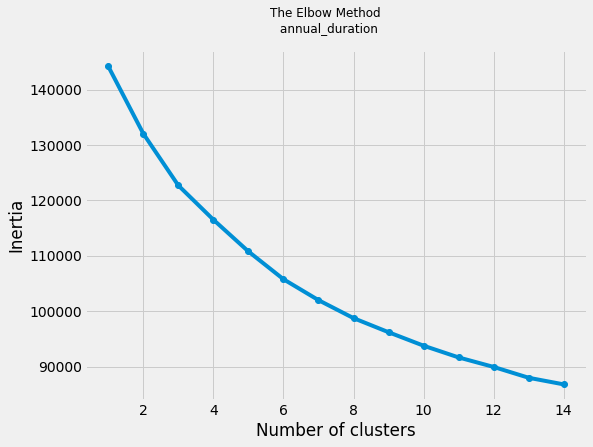

Number of clusters: 6


In [545]:
# Elbow method

def elbow_method(df_cluster, selected_metrics, mean):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,6))
    if mean == True:
        X = df_cluster[selected_metrics]
    else:
        X = df_cluster

    # Save inertias (sum of squared Euclidean distances from each point to the centroid (SSE))
    # Note: As number of clusters increases, inertias decrease
    inertias = []
    number_clusters = range(1,15)
    
    for i in number_clusters:
        kmeans = KMeans(n_clusters=i, random_state=myseed)
        kmeans.fit(X)
        inertias.append(kmeans.inertia_)

    #plt.style.use("fivethirtyeight")
    plt.plot(number_clusters, inertias, marker='o')
    plt.suptitle(f'The Elbow Method \n {selected_metrics}', fontsize=12)
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.savefig(f'Saved_Visuals/Clustering/cluster_number/elbow_{date_range}_{percentile}_{figname}_{selected_metrics}.png', bbox_inches='tight')
    plt.show()
    
    k1 = KneeLocator(number_clusters, inertias, curve='convex', direction='decreasing')
    print(f'Number of clusters:', k1.elbow)
    
    return

#for metric in metric_list: # add extra bracket around [selected_metrics]
#    elbow_method(df, metric)
    
elbow_method(df_cluster, selected_metrics, mean)

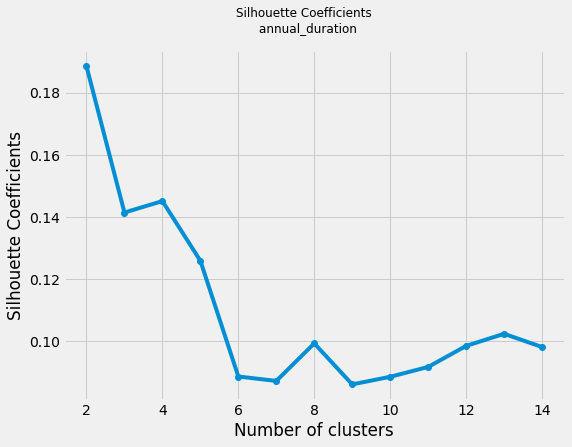

In [546]:
# Silhouette coefficient

def silhouette_coeff(df_cluster, selected_metrics, mean):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,6))
    if mean == True:
        X = df_cluster[selected_metrics]
    else:
        X = df_cluster

    # Save coefficients
    # Note: As number of clusters increases, inertias decrease
    silhouette_coefficients = []
    number_clusters = range(2,15)
    
    for i in number_clusters:
        kmeans = KMeans(n_clusters=i, random_state=myseed)
        kmeans.fit(X)
        score = silhouette_score(X, kmeans.labels_)
        silhouette_coefficients.append(score)

    plt.plot(number_clusters, silhouette_coefficients, marker='o')
    plt.suptitle(f'Silhouette Coefficients \n {selected_metrics}', fontsize=12)
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Coefficients')
    plt.grid(True)
    plt.savefig(f'Saved_Visuals/Clustering/cluster_number/silhouette_{date_range}_{percentile}_{figname}_{selected_metrics}.png', bbox_inches='tight')
    plt.show()
    
    return

silhouette_coeff(df_cluster, selected_metrics, mean)

## K-means clustering

In [463]:
import sklearn
from sklearn.cluster import KMeans

### Clustering for individual HMF metrics

In [547]:
plot_huc2 = True
plot_aq_10 = False
n_clusters = 5

def kmeans_clusters_map(df_cluster, df, metric_list, lower48, huc2, aq_usgs_selected_10, n_clusters, mean):
    i = 0
    j = 0
    k = 0
    fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(35, 35))
    
    legend_frmt = {
    "title": f"Legend",
    #"reverse": False,
    #"loc": "lower right",
    "facecolor": "white",
    #"alignment": 'center',
    "edgecolor": 'none',
    "framealpha": 0.80,
    'fontsize': 20,
    'title_fontsize': 30
    }
        
    for metric in metric_list:
        if mean == True:
            X = df_cluster[selected_metrics]
        else:
            X = df_cluster

        # Specify the number of clusters
        kmeans = KMeans(init="random", n_clusters=n_clusters, random_state = myseed)

        # Fit the data to the algorithm
        kmeans.fit(X)

        # Get the cluster centroids and labels
        centroids = kmeans.cluster_centers_
        clusters = kmeans.labels_

        #identified_clusters = kmeans.fit_predict(X)

        df['clusters'] = clusters

        # Set counter for axes
        if k in [2, 3]:
            i = 1
            j = k - 2
        elif k in [4, 5]:
            i = 2
            j = k - 4
        elif k in [6, 7]:
            i = 3
            j = k - 6
        else:
            pass

        plt.suptitle(f'K-Means Clustered Gages', fontsize=20)
        ax[i,j].set_title(f'{fn.FLOW_METRIC_UNITS[metric]}', fontsize=18)

        #lower48 = lower48.to_crs(epsg=4269)
        lower48 = lower48.to_crs('ESRI:102003')
        lower48.plot(ax=ax[i,j], edgecolor='black', facecolor='none', linewidth=1.0) 

        #stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2) 

        lat = df['dec_lat_va'].tolist()
        long = df['dec_long_va'].tolist()
        geometry = [Point(xy) for xy in zip(long, lat)]
        df['geometry'] = geometry
        geo_df = gpd.GeoDataFrame(df, crs=4269, geometry=geometry)
        geo_df.crs = "epsg:4269"
        geo_df = geo_df.to_crs('ESRI:102003')

        classifier = mc.NaturalBreaks(geo_df['clusters'], k=n_clusters)

        bx = geo_df.plot(ax=ax, column='clusters', scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                         cmap='rainbow', marker='o', markersize=35, edgecolor='black', linewidth=0.7, 
                         alpha=0.9, legend=True, legend_kwds=legend_frmt)

        if plot_huc2 == True:
            huc2 = huc2.to_crs(epsg=4269)
            huc2.plot(ax=ax[i,j], edgecolor='black', facecolor='none', linewidth=3.0) 

        if plot_aq_10 == True:
            aq_usgs_selected_10 = aq_usgs_selected_10.to_crs(epsg=4269)
            aq_usgs_selected_10.plot(ax=ax[i,j], edgecolor='black', facecolor='purple', linewidth=1.5, alpha=0.2)

        ax[i,j].margins(0, tight=True)
        ax[i,j].set_axis_off()
        
        j += 1
        k += 1
        
    plt.savefig(f'Saved_Visuals/Clustering/kmeans/map_{date_range}_{percentile}_{figname}_{selected_metrics}_{n_clusters}.png', bbox_inches='tight')
    plt.show()
    return
    
#kmeans_clusters_map(df_cluster, df, metric_list, lower48, huc2, aq_usgs_selected_10, n_clusters, mean)

### Clustering for multiple HMF metrics

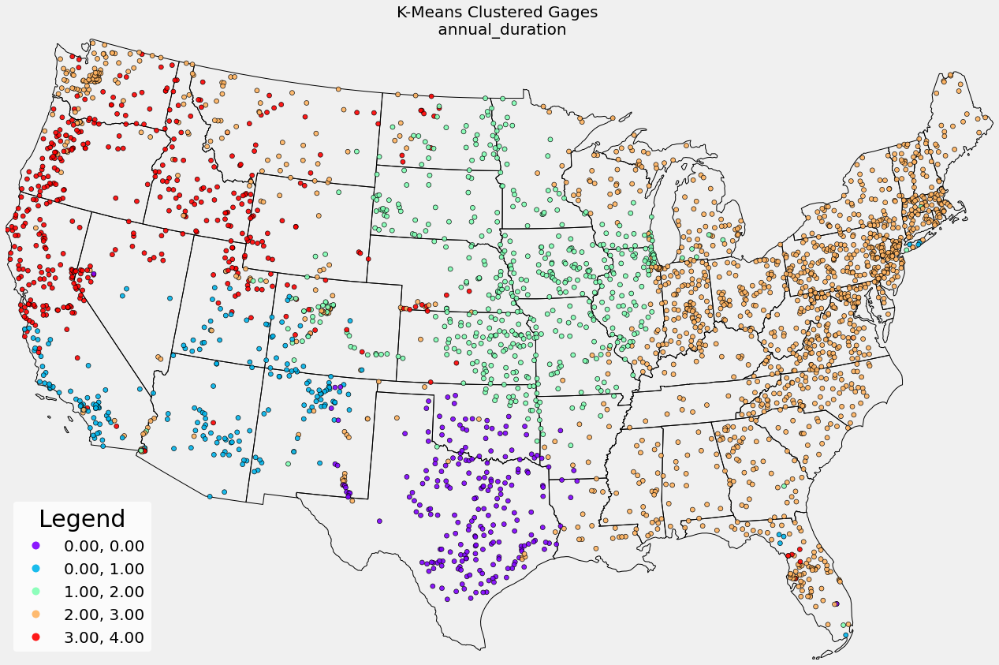

In [558]:
plot_huc2 = False
plot_aq_10 = False
n_clusters = 5

def kmeans_clusters_map(df_cluster, df, selected_metrics, lower48, huc2, aq_usgs_selected_10, n_clusters, mean):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
    
    legend_frmt = {
    "title": f"Legend",
    #"reverse": False,
    #"loc": "lower right",
    "facecolor": "white",
    #"alignment": 'center',
    "edgecolor": 'none',
    "framealpha": 0.80,
    'fontsize': 20,
    'title_fontsize': 30
    }
        
    if mean == True:
        X = df_cluster[selected_metrics]
    else:
        X = df_cluster

    # Specify the number of clusters
    kmeans = KMeans(init="random", n_clusters=n_clusters, random_state = myseed)

    # Fit the data to the algorithm
    kmeans.fit(X)

    # Get the cluster centroids and labels
    centroids = kmeans.cluster_centers_
    clusters = kmeans.labels_
    #print(labels[0:10])

    #identified_clusters = kmeans.fit_predict(X)

    df['clusters'] = clusters
    #print(df.head())

    plt.title(f'K-Means Clustered Gages \n {selected_metrics}', fontsize=20)

    #lower48 = lower48.to_crs(epsg=4269)
    lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 

    #stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2) 

    lat = df['dec_lat_va'].tolist()
    long = df['dec_long_va'].tolist()
    geometry = [Point(xy) for xy in zip(long, lat)]
    df['geometry'] = geometry
    geo_df = gpd.GeoDataFrame(df, crs=4269, geometry=geometry)
    geo_df.crs = "epsg:4269"
    geo_df = geo_df.to_crs('ESRI:102003')
    
    classifier = mc.NaturalBreaks(geo_df['clusters'], k=n_clusters)

    bx = geo_df.plot(ax=ax, column='clusters', scheme='user_defined', classification_kwds={'bins': classifier.bins}, cmap='rainbow', marker='o', markersize=35, 
                         edgecolor='black', linewidth=0.7, alpha=0.9, legend=True, legend_kwds=legend_frmt) # legend_kwds={"shrink":.5},

    if plot_huc2 == True:
        #huc2 = huc2.to_crs(epsg=4269)
        huc2 = huc2.to_crs('ESRI:102003')
        huc2.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=2.0) 

    if plot_aq_10 == True:
        aq_usgs_selected_10 = aq_usgs_selected_10.to_crs(epsg=4269)
        aq_usgs_selected_10.plot(ax=ax, edgecolor='black', facecolor='purple', linewidth=1.5, alpha=0.2)

    ax.margins(0, tight=True)
    ax.set_axis_off()
    #plt.legend()
        
    plt.savefig(f'Saved_Visuals/Clustering/kmeans/map_{date_range}_{percentile}_{figname}_{selected_metrics}_{n_clusters}.png', bbox_inches='tight')
    plt.show()
    return

if mean == True:
    kmeans_clusters_map(df_cluster, df, selected_metrics, lower48, huc2, aq_usgs_selected_10, 
                        n_clusters, mean)
else:
    kmeans_clusters_map(df_cluster, scaled_timeseries_metric_nonan, selected_metrics, 
                        lower48, huc2, aq_usgs_selected_10, n_clusters, mean)
    
#for metric in metric_list: # put extra bracket around [selected_metrics] in code 
#    kmeans_clusters_map(df_cluster, df, metric, lower48, huc2, aq_usgs_selected_10, n_clusters)

### Distribution of HMF metrics in each cluster (box plots)

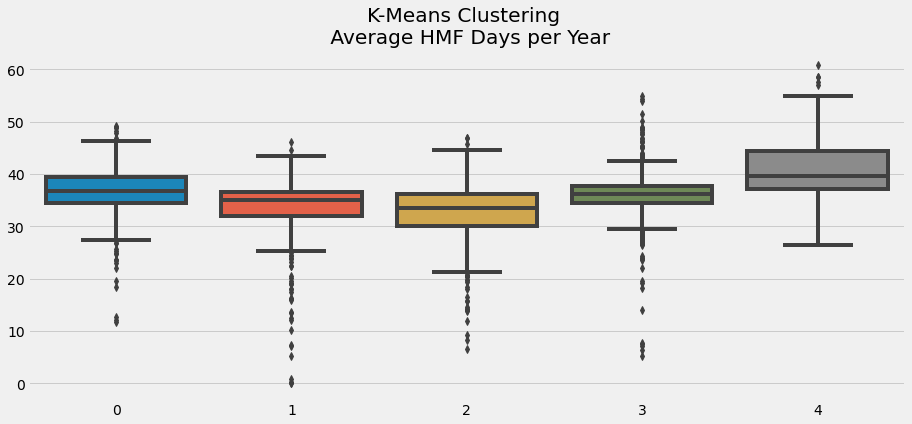

In [610]:
# Distribution of distinct groups
if mean == True:
    X = df_cluster[selected_metrics]
    df = df[selected_metrics]
else:
    X = df_cluster
    col_to_keep_num = list(range(1970, 2020))
    pivot_df["site_no"] = pivot_df["site_no"].astype(np.int64)
    scaled_timeseries_metric_nonan["site_no"] = scaled_timeseries_metric_nonan["site_no"].astype(np.int64)
    df = pivot_df[pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))][list(range(1990, 2020))].mean(axis=1)
    #df = pivot_df[pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))][col_to_keep_num].mean(axis=1)

# Specify the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=myseed)

# Fit the data to the algorithm
kmeans.fit(X)

# Get the cluster centroids and labels
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

# for metric in selected_metrics:
#     sns.boxplot(x = kmeans.labels_, y = df[metric]).set(title=f'K-Means Clustering \n {fn.FLOW_METRIC_UNITS[metric]}')
#     plt.show()

sns.boxplot(x = kmeans.labels_, y = df).set(title=f'K-Means Clustering \n {fn.FLOW_METRIC_UNITS[selected_metrics]}')
plt.show()

## Hierarchical Clustering

In [280]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import AgglomerativeClustering

### Clustering for multiple HMF metrics

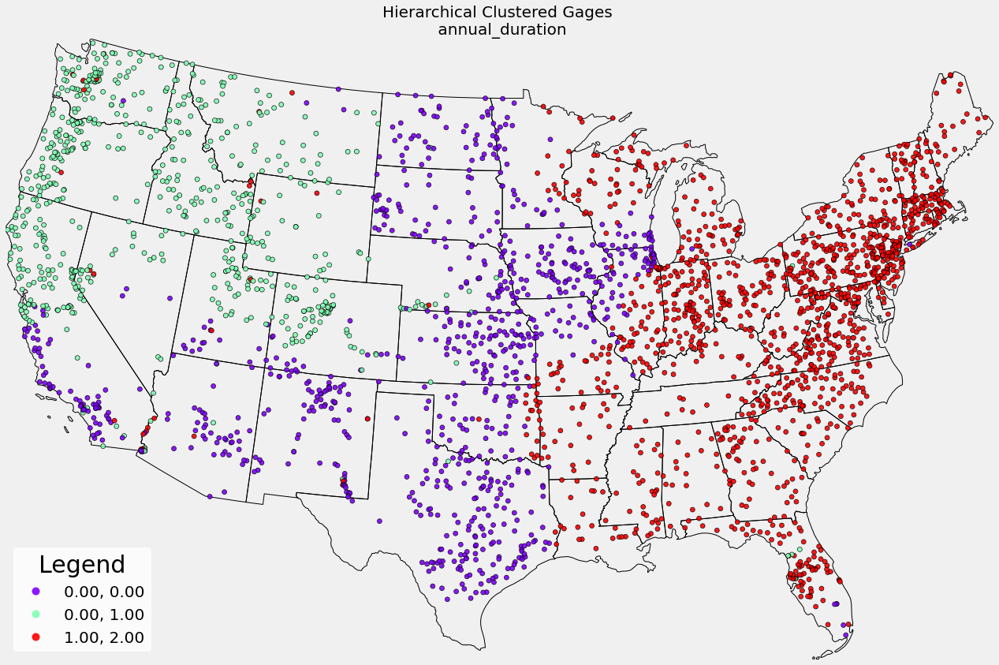

In [613]:
plot_huc2 = False
plot_aq_10 = False
n_clusters = 3
method = 'average'
metric = 'correlation'
#metric = 'euclidean'

def hierarch_clusters_map(df_cluster, df, selected_metrics, lower48, huc2, aq_usgs_selected_10, n_clusters, mean):
    
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
    
    legend_frmt = {
    "title": f"Legend",
    #"reverse": False,
    #"loc": "lower right",
    "facecolor": "white",
    #"alignment": 'center',
    "edgecolor": 'none',
    "framealpha": 0.80,
    'fontsize': 20,
    'title_fontsize': 30
    }
    
    if mean == True:
        X = df_cluster[selected_metrics]
    else:
        X = df_cluster

    # Fit the data to the tree and get the cluster centroids and labels (method 1)
    #cluster_data = linkage(X, method=method, metric=metric)
    #clusters = fcluster(cluster_data, n_clusters, criterion='maxclust')
    
    # Fit the data to the tree and get the cluster centroids and labels (method 2)
    hierarchical_cluster = AgglomerativeClustering(n_clusters=n_clusters, affinity=metric, linkage=method)
    clusters = hierarchical_cluster.fit_predict(X)

    df['clusters'] = clusters

    plt.title(f'Hierarchical Clustered Gages \n {selected_metrics}', fontsize=20)

    #lower48 = lower48.to_crs(epsg=4269)
    lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 

    #stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2) 

    lat = df['dec_lat_va'].tolist()
    long = df['dec_long_va'].tolist()
    geometry = [Point(xy) for xy in zip(long, lat)]
    df['geometry'] = geometry
    geo_df = gpd.GeoDataFrame(df, crs=4269, geometry=geometry)
    geo_df = geo_df.to_crs('ESRI:102003')

    classifier = mc.NaturalBreaks(geo_df['clusters'], k=n_clusters)

    bx = geo_df.plot(ax=ax, column='clusters', scheme='user_defined', classification_kwds={'bins': classifier.bins}, cmap='rainbow', marker='o', markersize=35, 
                         edgecolor='black', linewidth=0.7, alpha=0.9, legend=True, legend_kwds=legend_frmt) # legend_kwds={"shrink":.5},

    if plot_huc2 == True:
        huc2 = huc2.to_crs(epsg=4269)
        huc2.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=3.0) 

    if plot_aq_10 == True:
        aq_usgs_selected_10 = aq_usgs_selected_10.to_crs(epsg=4269)
        aq_usgs_selected_10.plot(ax=ax, edgecolor='black', facecolor='purple', linewidth=1.5, alpha=0.2)

    ax.margins(0, tight=True)
    ax.set_axis_off()
        
    plt.savefig(f'Saved_Visuals/Clustering/hierarch/map_{date_range}_{percentile}_{figname}_{selected_metrics}_{n_clusters}.png', bbox_inches='tight')
    plt.show()
    return
  
if mean == True:    
    hierarch_clusters_map(df_cluster, df, selected_metrics, lower48, huc2, aq_usgs_selected_10, 
                          n_clusters, mean)
else:
    hierarch_clusters_map(df_cluster, scaled_timeseries_metric_nonan, selected_metrics, lower48, huc2, aq_usgs_selected_10, 
                          n_clusters, mean)

### Distribution of HMF metrics in each cluster

[3 3 3 ... 2 2 2]


C:\Users\kondr\anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



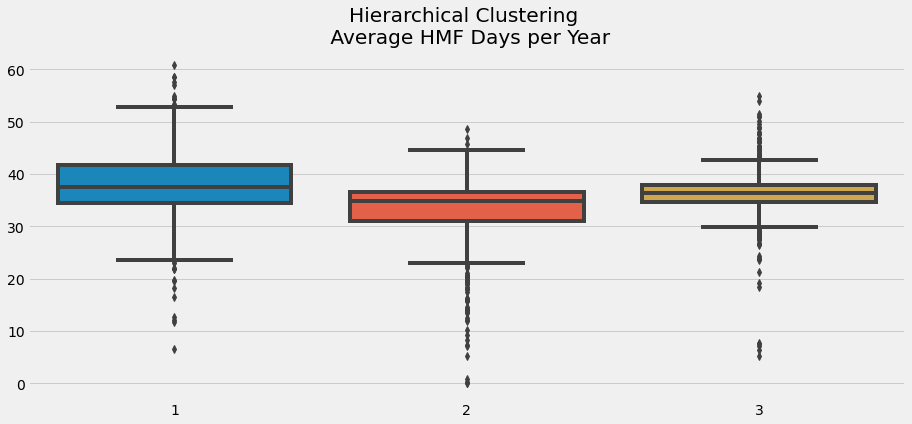

In [617]:
if mean == True:
    X = df_cluster[selected_metrics]
    df = df[selected_metrics]
else:
    X = df_cluster
    col_to_keep_num = list(range(1970, 2020))
    pivot_df["site_no"] = pivot_df["site_no"].astype(np.int64)
    scaled_timeseries_metric_nonan["site_no"] = scaled_timeseries_metric_nonan["site_no"].astype(np.int64)
    df = pivot_df[pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))][list(range(1990, 2020))].mean(axis=1)
    #df = pivot_df[pivot_df['site_no'].isin(list(scaled_timeseries_metric_nonan['site_no']))][col_to_keep_num].mean(axis=1)

# Method 1 - Linkage
cluster_data = linkage(X, method=method, metric=metric)
clusters = fcluster(cluster_data, n_clusters, criterion='maxclust')
X["cluster"] = clusters

# for metric in selected_metrics:
#     sns.boxplot(x = X['cluster'], df).set(title=f'Hierarchical Clustering \n {fn.FLOW_METRIC_UNITS[metric]}')
#     plt.show()
    
sns.boxplot(x = clusters, y=df).set(title=f'Hierarchical Clustering \n {fn.FLOW_METRIC_UNITS[selected_metrics]}')
plt.show()
    
# # Method 2 - Agglomerative clustering
# hierarchical_cluster = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=method)
# clusters = hierarchical_cluster.fit_predict(X)
# X["cluster"] = clusters
# print(clusters)


### Dendograms

In [489]:
complete_dist_clustering = linkage(df_cluster, method="complete", metric="euclidean")
avg_dist_clustering = linkage(df_cluster, method="average", metric="euclidean")
single_dist_clustering = linkage(df_cluster, method="single", metric="euclidean")

complete_corr_clustering = linkage(df_cluster, method='complete', metric='correlation')
avg_corr_clustering = linkage(df_cluster, method='average', metric='correlation')
single_corr_clustering = linkage(df_cluster, method='single', metric='correlation')

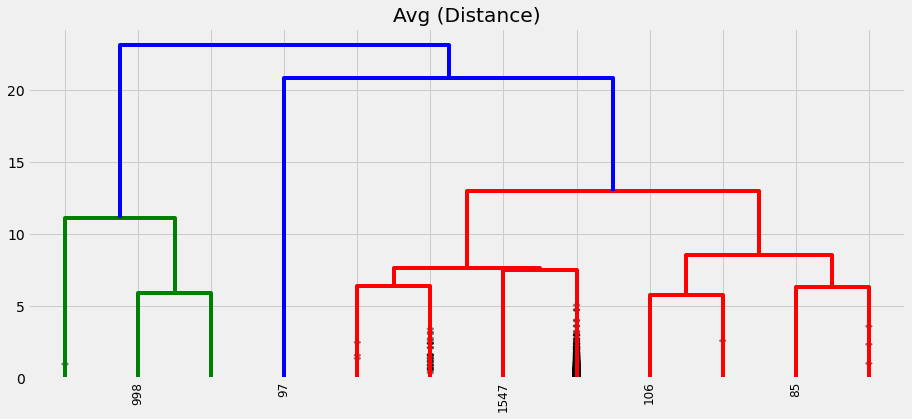

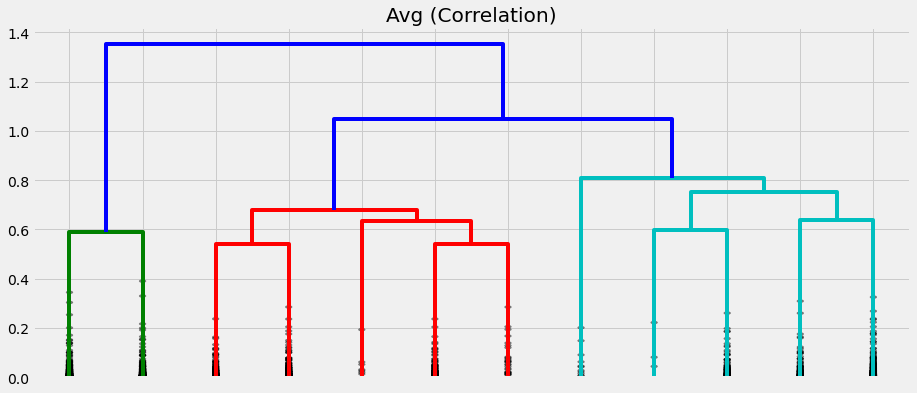

In [490]:
# Distance versus correlation (single)
dendrogram(avg_dist_clustering, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=12,  # show only the last p merged clusters)
           show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True  # to get a distribution impression in truncated branches
)
plt.title('Avg (Distance)')
plt.show()

dendrogram(avg_corr_clustering, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=12,  # show only the last p merged clusters)
           show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True  # to get a distribution impression in truncated branches
)
plt.title('Avg (Correlation)')
plt.show()

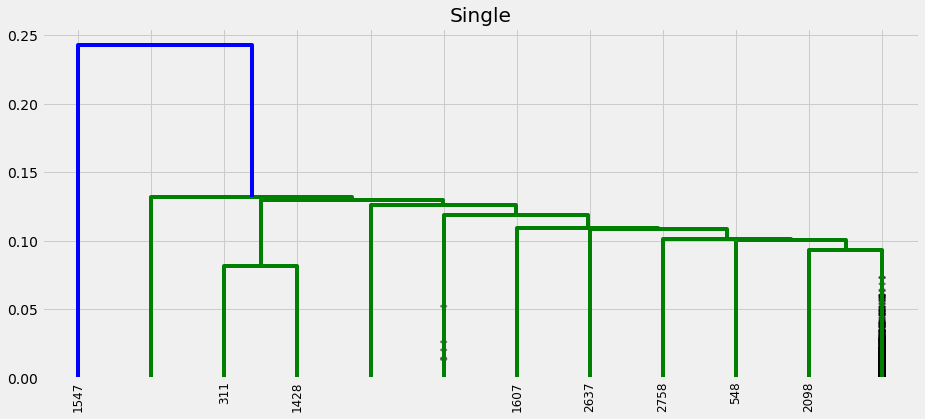

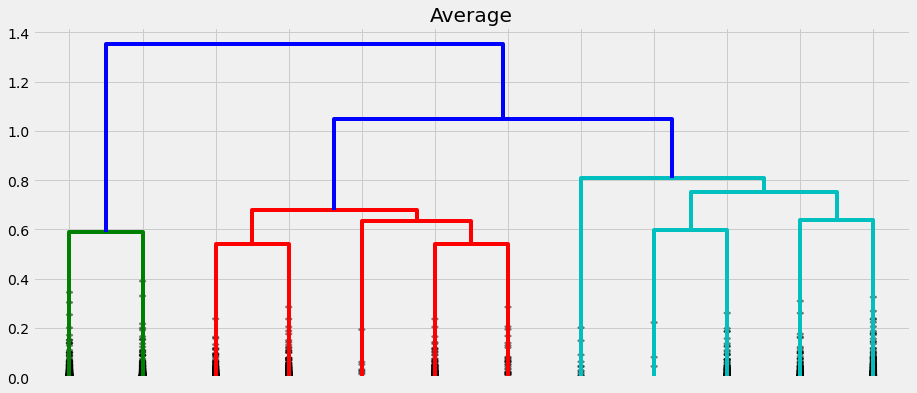

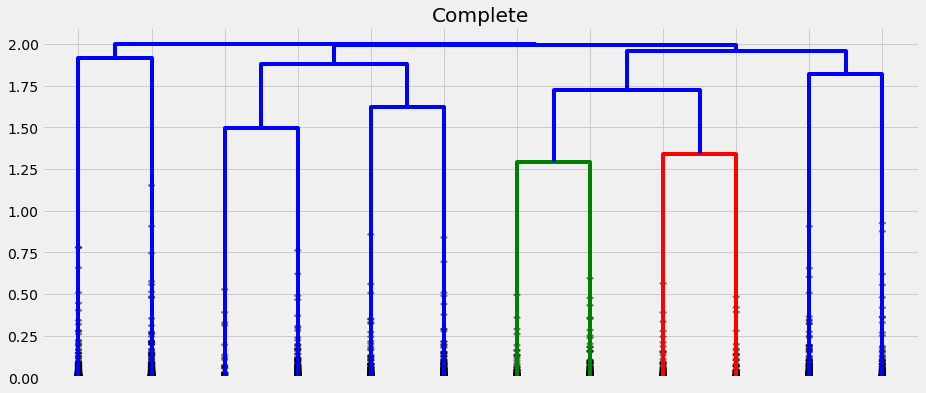

In [491]:
# Single versus avg (correlation)
dendrogram(single_corr_clustering, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=12,  # show only the last p merged clusters)
           show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True  # to get a distribution impression in truncated branches
)
plt.title('Single')
plt.show()

dendrogram(avg_corr_clustering, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=12,  # show only the last p merged clusters)
           show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True  # to get a distribution impression in truncated branches
)
plt.title('Average')
plt.show()

dendrogram(complete_corr_clustering, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=12,  # show only the last p merged clusters)
           show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True  # to get a distribution impression in truncated branches
)
plt.title('Complete')
plt.show()

## Annual timeseries clustering

### Example of timeseries clustering

In [51]:
# Example: https://stackoverflow.com/questions/34940808/hierarchical-clustering-of-time-series-in-python-scipy-numpy-pandas
import numpy as np
import seaborn as sns
import pandas as pd
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt

# build 6 time series groups for testing, called: a, b, c, d, e, f

num_samples = 61
group_size = 10

# create the main time series for each group

x = np.linspace(0, 5, num_samples)
scale = 4

a = scale * np.sin(x)
b = scale * (np.cos(1+x*3) + np.linspace(0, 1, num_samples))
c = scale * (np.sin(2+x*6) + np.linspace(0, -1, num_samples))
d = scale * (np.cos(3+x*9) + np.linspace(0, 4, num_samples))
e = scale * (np.sin(4+x*12) + np.linspace(0, -4, num_samples))
f = scale * np.cos(x)

# from each main series build 'group_size' series

timeSeries = pd.DataFrame()
ax = None
for arr in [a,b,c,d,e,f]:
    #print(arr)
    arr = arr + np.random.rand(group_size, num_samples) + np.random.randn(group_size, 1)
    #print(arr)
    df = pd.DataFrame(arr)
    timeSeries = timeSeries.append(df) # timeSeries = [columns: timesteps, rows=different ids]

    # We use seaborn to plot what we have
    #ax = sns.tsplot(ax=ax, data=df.values, ci=[68, 95])
    #ax = sns.lineplot(ax=ax, data=df.values)

plt.show()

# Do the clustering
Z = hac.linkage(timeSeries, method='single', metric='correlation')

# # Here we use spearman correlation
# def my_metric(x, y):
#     r = stats.pearsonr(x, y)[0]
#     return 1 - r # correlation to distance: range 0 to 2

# # Do the clustering    
# Z = hac.linkage(timeSeries,  method='single', metric=my_metric)

# Plot dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
hac.dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()